In [1]:
from __future__ import print_function
import librosa
import numpy as np
import matplotlib.pyplot as plt
import json
from statistics import stdev
%matplotlib inline

In [2]:
samples_per_chunk = 300
num_chunks_per_slice = 65
num_chunks_per_beat = 8

In [3]:
def loadbeatmap_3dout(beatmap, num_beats, num_chunks_per_beat=8):
    if beatmap[len(beatmap)-5:len(beatmap)] != ".json":
        print("Beatmap file " + audio + " is not of type .json")
        return -1
    
    with open(beatmap) as f:
        data = json.load(f)
  
    notes = "_notes"
    time = "_time"
    line_index = "_lineIndex" #column number
    line_layer = "_lineLayer" #row number
    note_color = "_type" #0 is one color and 1 is the other
    cut_direction = "_cutDirection"#9 cut directions

    dim_0 = num_beats * num_chunks_per_beat
    
    # number of rows and columns in the playfield
    # number of cells in the playfield (each cell can hold at most 1 note)
    playfield_rows = 3
    playfield_cols = 4
    playfield_cell_count = playfield_rows * playfield_cols
    
    # number of colors (2): red, blue (order unknown)
    # number of directions notes can face (9): 
    # up, down, left, right, up-left, up-right, down-left, down-right, dot (order unknown)
    note_color_count = 2
    note_direction_count = 9
    
    # dimensions for a 'one-hot' representation of a single time unit (chunk)
    dim_1 = playfield_rows
    dim_2 = playfield_cols
    dim_3 = (note_color_count + 1) + note_direction_count
    
    # initialize matrix to zeros, then set the "no note" bit for each block at each timestep to 1
    outMatrix = np.zeros(shape=(dim_0, dim_1, dim_2, dim_3))
    outMatrix[:,:,:,0] = 1
    

    # for every note in the beatmap, set the color and direction bits for the proper cell to 1
    for n in range(len(data[notes])):
        entry = int(np.round(data[notes][n][time]*num_chunks_per_beat)) #convert time to row index by rounding to nearest 1/8 beat
        if data[notes][n][note_color] < 2:
            outMatrix[entry] \
                     [data[notes][n][line_layer]] \
                     [data[notes][n][line_index]] \
                     [data[notes][n][note_color]+1] = 1
            outMatrix[entry] \
                     [data[notes][n][line_layer]] \
                     [data[notes][n][line_index]] \
                     [0] = 0
            outMatrix[entry] \
                     [data[notes][n][line_layer]] \
                     [data[notes][n][line_index]] \
                     [data[notes][n][cut_direction]+3] = 1

    return outMatrix

In [4]:
def mean_center(x): 
    return (x - np.apply_along_axis(np.mean, 0, x) )

def mean_center_norm(x): 
    return (x - np.apply_along_axis(np.mean, 0, x) )/ np.apply_along_axis(np.std, 0, x)

In [5]:
# 0 = no note; 1 = blue; 2 = red; 3 = both
def encode_note_color(x):
    return (np.max(x[:,:,0])*1+ np.max(x[:,:,1])*2)

In [6]:
def loadsong(audio, samples_per_chunk=300, num_chunks_per_slice=65, num_chunks_per_beat=8, verbose=0):
    if audio[len(audio)-4:len(audio)] != ".ogg":
        print("Audio file " + audio + " is not of type .ogg")
        return -1
    
    y, sr = librosa.load(audio)
    
    song_length = librosa.get_duration(y=y,sr=sr) / 60.0
    tempo = np.round(librosa.beat.tempo(y, sr=sr))
    new_sample_rate = (tempo/200)*8000
    
    y = librosa.resample(y, sr, new_sample_rate)
    
    number_of_beats = int(tempo * song_length)
    
    return y[0:(len(y)//(samples_per_chunk*num_chunks_per_beat)*(samples_per_chunk*num_chunks_per_beat))], new_sample_rate, number_of_beats

In [ ]:
def data_prep():

In [ ]:
def append_song(init_song, init_beatmap, song_filepath, beatmap_filepath):
    
    
    return (new_song, new_beatmap)

In [7]:
song0_y, song0_sr, song0_num_beats = loadsong("song.ogg")

/nfshome/apps/python-3.6.7/lib/python3.6/site-packages/scipy/fftpack/basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


In [8]:
song1_y = song0_y
song1_sr = song0_sr
song1_num_beats = song0_num_beats
print("Original: ",np.shape(song1_y))
song1_y = song1_y.reshape(len(song1_y)//300,300)
print("Reshaped: ",np.shape(song1_y))

Original:  (1233600,)
Reshaped:  (4112, 300)


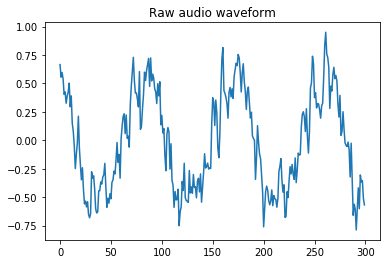

In [9]:
plt.title("Raw audio waveform")
plt.plot(range(len(song1_y[0])),song1_y[1000])
plt.show()

In [10]:
song1_fft = np.abs(np.apply_along_axis(np.fft.fft, 1, song1_y))[:,0:(int)(samples_per_chunk/2)+1]
print("Shape after Fourier transform: ",np.shape(song1_fft))

Shape after Fourier transform:  (4112, 151)


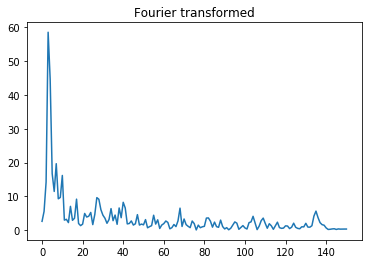

In [11]:
plt.title("Fourier transformed")
plt.plot(range(len(song1_fft[0])),song1_fft[1000])
plt.show()

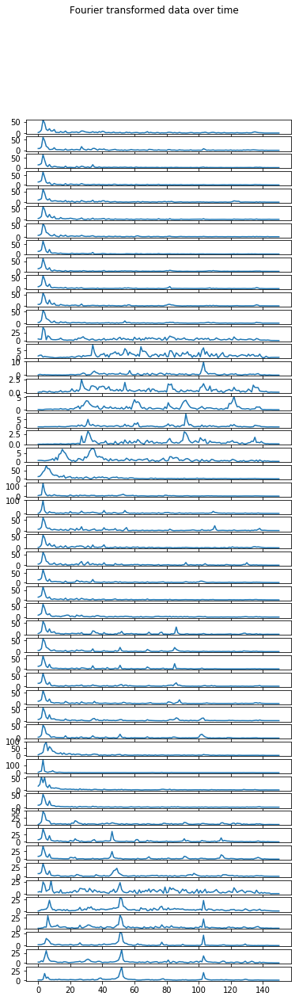

In [12]:
fig,axes = plt.subplots(50) 
fig.suptitle("Fourier transformed data over time")
#fig.set_figwidth(12) 
fig.set_figheight(20)
for x in range(50):
    axes[x].plot(range(len(song1_fft[100])),song1_fft[1000+x]) 
        
plt.show()

In [39]:
song1_fft_mc = np.apply_along_axis(mean_center, 0, song1_fft)
song1_fft_mc

array([[ -4.39565474,  -6.08029625, -18.89538943, ...,  -0.22226124,
         -0.22029386,  -0.21956174],
       [ -4.39565474,  -6.08029625, -18.89538943, ...,  -0.22226124,
         -0.22029386,  -0.21956174],
       [ -4.39565474,  -6.08029625, -18.89538943, ...,  -0.22226124,
         -0.22029386,  -0.21956174],
       ...,
       [ -4.39565474,  -6.08029625, -18.89538943, ...,  -0.22226124,
         -0.22029386,  -0.21956174],
       [ -4.39565474,  -6.08029625, -18.89538943, ...,  -0.22226124,
         -0.22029386,  -0.21956174],
       [ -4.39565474,  -6.08029625, -18.89538943, ...,  -0.22226124,
         -0.22029386,  -0.21956174]])

In [14]:
song1_fft_mc_norm = np.apply_along_axis(mean_center_norm, 0, song1_fft_mc )

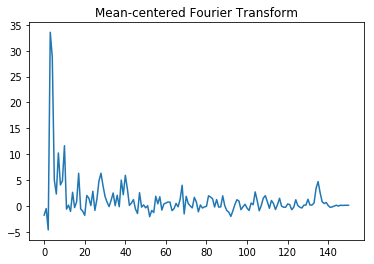

In [15]:
plt.title("Mean-centered Fourier Transform")
plt.plot( range(len(song1_fft_mc[0])) , song1_fft_mc[1000] )
plt.show()

In [38]:
song1_fft_mc[1000]

array([-1.79315755e+00, -5.27299036e-01, -4.65465755e+00,  3.35609672e+01,
        2.87409698e+01,  4.96466090e+00,  2.27914826e+00,  1.02227773e+01,
        4.03842840e+00,  4.83469635e+00,  1.16237367e+01, -6.35790013e-01,
        1.38272397e-01, -1.07105642e+00,  2.61582973e+00, -3.41817811e-01,
        7.97039763e-01,  6.28956467e+00, -5.94785597e-01, -1.03797877e+00,
       -1.83276037e+00,  1.99851744e+00,  1.50817299e+00,  6.05801521e-02,
        2.81376365e+00, -8.83855258e-01,  1.31724441e+00,  4.82298472e+00,
        6.30362403e+00,  3.89373274e+00,  1.81280043e+00,  7.13601146e-01,
       -1.51321468e-01,  1.08364775e+00,  2.48915837e+00,  3.49044532e-02,
        2.04595398e+00, -1.72084563e-01,  4.98584509e+00,  2.14645970e+00,
        5.90358133e+00,  3.30329123e+00,  9.05096206e-02,  5.26303805e-01,
        1.20506450e+00, -6.18353566e-01, -1.48429063e+00,  2.53725725e+00,
       -2.48067120e-01,  1.78209718e-01, -3.84767396e-01,  1.99980634e-02,
       -2.10594726e+00, -

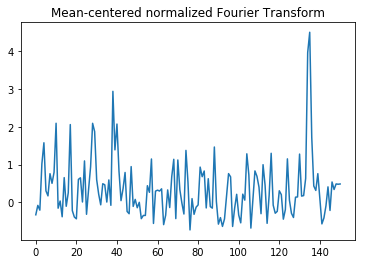

In [16]:
plt.plot( range(len(song1_fft_mc_norm[0])) , song1_fft_mc_norm[1000] )
plt.title("Mean-centered normalized Fourier Transform")
plt.show()

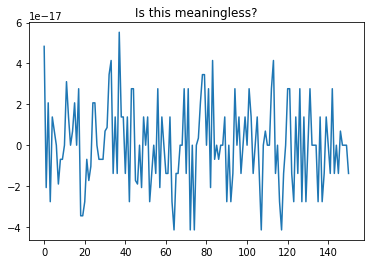

In [17]:
plt.plot( range(len(song1_fft_mc_norm[0])) , np.apply_along_axis(np.mean, 0, song1_fft_mc_norm) )
plt.title("Is this meaningless?")
plt.show()

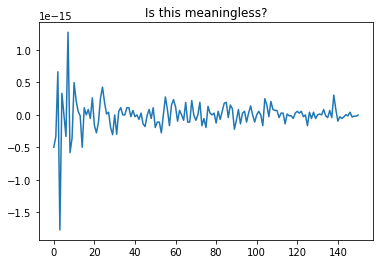

In [18]:
plt.plot( range(len(song1_fft_mc[0])) , np.apply_along_axis(np.mean, 0, song1_fft_mc) )
plt.title("Is this meaningless?")
plt.show()

In [19]:
beatmap1 = loadbeatmap_3dout("Expert.json", song1_num_beats)

In [20]:
beatmap1[644]

array([[[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],

       [[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],

       [[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]])

In [21]:
np.shape(beatmap1)

(4112, 3, 4, 12)

In [22]:
beatmap1_slice = beatmap1[:,:,:,1:3]

In [23]:
beatmap1_slice[644]

array([[[0., 0.],
        [1., 0.],
        [0., 0.],
        [0., 0.]],

       [[0., 0.],
        [0., 0.],
        [0., 1.],
        [0., 0.]],

       [[0., 0.],
        [0., 0.],
        [0., 0.],
        [0., 0.]]])

In [24]:
np.shape(beatmap1_slice)

(4112, 3, 4, 2)

In [26]:
beatmap1_encoded = np.array([encode_note_color(x) for x in beatmap1_slice])

In [27]:
np.shape(beatmap1_encoded)

(4112,)

In [310]:
beatmap1_encoded[600:650]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 3., 0., 0., 0., 0.,
       0., 0., 0., 3., 0., 0., 0., 0., 0., 0., 0., 3., 0., 0., 0., 0., 0.,
       0., 0., 3., 0., 0., 0., 0., 0., 0., 0., 3., 0., 0., 0., 0., 0.])

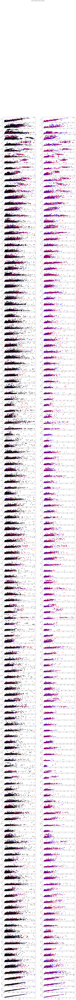

In [31]:
fig,axes = plt.subplots(149,2) 
fig.set_figwidth(20) 
fig.set_figheight(250)
fig.suptitle("Fourier transform, Mean-centered")
for x in range(149):
    for y in range(2):
        start = x
        slice = (start, start+1)
        if y == 0:
            axes[x,y].scatter(song1_fft_mc[:,slice[0]],song1_fft_mc[:,slice[1]],
                    color=[['black','red','blue','purple'][i] for i in beatmap1_encoded.astype(int)])
            axes[x,y].set_xlabel(str("PC"+str(slice[0])))
            axes[x,y].set_ylabel(str("PC"+str(slice[1])))
        else:
            axes[x,y].scatter(song1_fft_mc[:,slice[0]],song1_fft_mc[:,slice[1]],
                    color=[['none','red','blue','purple'][i] for i in beatmap1_encoded.astype(int)])
            axes[x,y].set_xlabel(str("PC"+str(slice[0])))
            axes[x,y].set_ylabel(str("PC"+str(slice[1])))


            
plt.show()

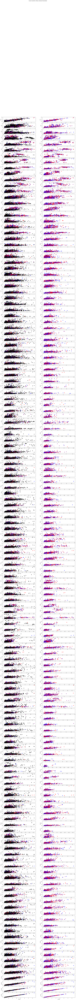

In [32]:
fig,axes = plt.subplots(149,2) 
fig.set_figwidth(20) 
fig.set_figheight(250)
fig.suptitle("Fourier transform, Mean-centered, Normalized")
for x in range(149):
    for y in range(2):
        start = x
        slice = (start, start+1)
        if y == 0:
            axes[x,y].scatter(song1_fft_mc_norm[:,slice[0]],song1_fft_mc_norm[:,slice[1]],
                    color=[['black','red','blue','purple'][i] for i in beatmap1_encoded.astype(int)])
            axes[x,y].set_xlabel(str("PC"+str(slice[0])))
            axes[x,y].set_ylabel(str("PC"+str(slice[1])))
        else:
            axes[x,y].scatter(song1_fft_mc_norm[:,slice[0]],song1_fft_mc_norm[:,slice[1]],
                    color=[['none','red','blue','purple'][i] for i in beatmap1_encoded.astype(int)])
            axes[x,y].set_xlabel(str("PC"+str(slice[0])))
            axes[x,y].set_ylabel(str("PC"+str(slice[1])))


            
plt.show()

In [33]:
U,S,V = np.linalg.svd(song1_fft_mc_norm,full_matrices=True)
# Percent variance accounted for


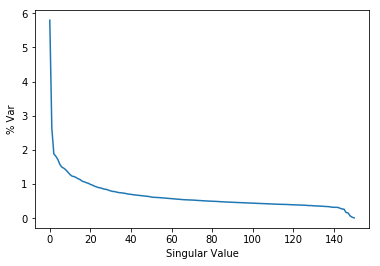

In [34]:
plt.plot(100.0*S/np.sum(S))
plt.ylabel('% Var')
plt.xlabel('Singular Value')
plt.show()

In [35]:
# Variance accounted for in the first two principal components
100.0*(np.sum(S[:2]))/np.sum(S)

8.431197311388523

In [37]:
X = song1_fft_mc_norm
Y = beatmap1_encoded

D = np.zeros([X.shape[0],X.shape[1]])
np.fill_diagonal(D,S)
Xrotated = np.dot(U,D)

PCs = Xrotated[:,0:150] 
PCs.shape

(4112, 150)

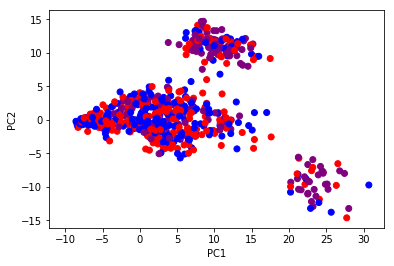

In [370]:
plt.scatter(PCs[:,0],PCs[:,1],
            color=[['none','red','blue','purple'][i] for i in Y.astype(int)])
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

In [371]:
PCs_2_X = np.array([x for x in PCs if x[0] < 16 and x[1] < 6])
PCs_2_Y = np.array([Y[i] for i in range(len(Y)) if PCs[i,0] < 16 and PCs[i,1] < 6] )

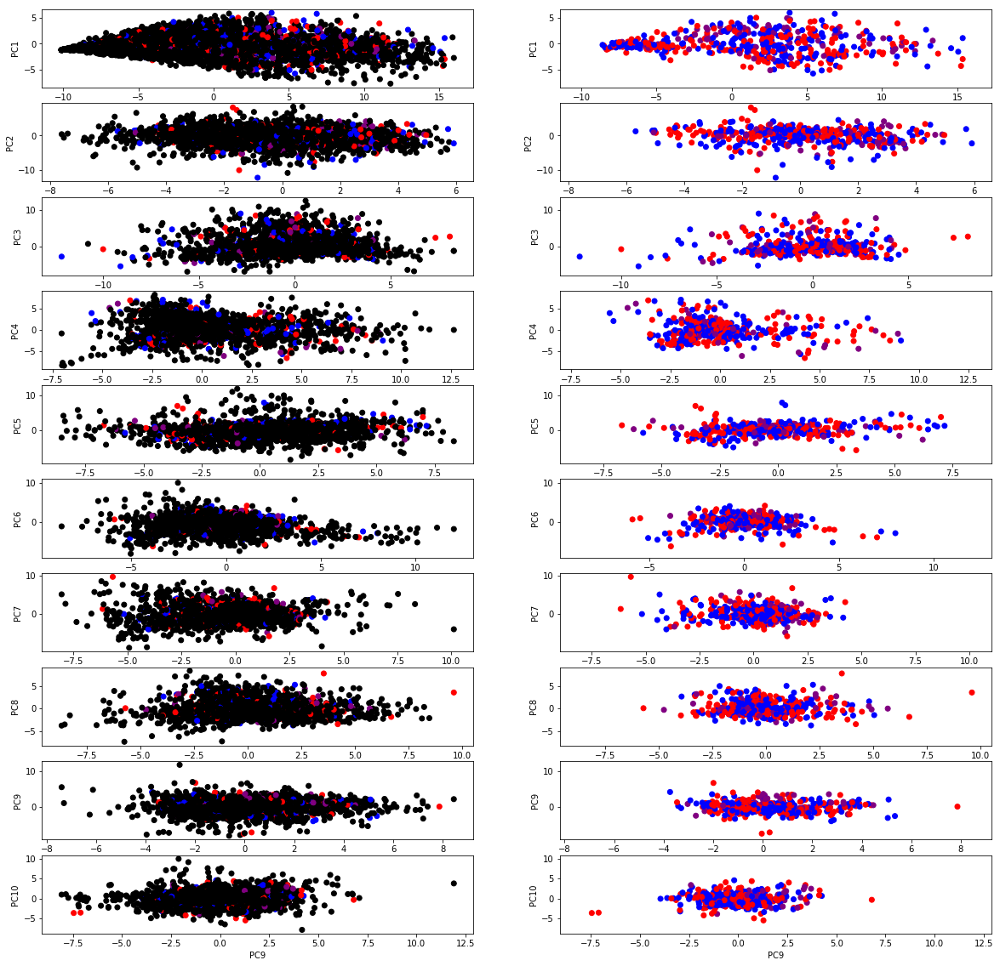

In [364]:
fig,axes = plt.subplots(10,2) 
fig.set_figwidth(20) 
fig.set_figheight(20)
for x in range(10):
    for y in range(2):
        start = x
        slice = (start, start+1)
        if y == 0:
            axes[x,y].scatter(PCs_2_X[:,slice[0]],PCs_2_X[:,slice[1]],
                    color=[['black','red','blue','purple'][i] for i in PCs_2_Y.astype(int)])
            axes[x,y].set_xlabel(str("PC"+str(slice[0])))
            axes[x,y].set_ylabel(str("PC"+str(slice[1])))
        else:
            axes[x,y].scatter(PCs_2_X[:,slice[0]],PCs_2_X[:,slice[1]],
                    color=[['none','red','blue','purple'][i] for i in PCs_2_Y.astype(int)])
            axes[x,y].set_xlabel(str("PC"+str(slice[0])))
            axes[x,y].set_ylabel(str("PC"+str(slice[1])))


            
plt.show()

#start = 5
#slice = (start, start+1)
#plt.scatter(PCs_2_X[:,slice[0]],PCs_2_X[:,slice[1]],
#            color=[['none','red','blue','purple'][i] for i in PCs_2_Y.astype(int)])
#plt.xlabel(str("PC"+str(slice[0])))
#plt.ylabel(str("PC"+str(slice[1])))
#plt.show()

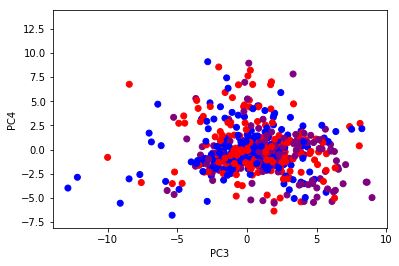

In [340]:
plt.scatter(PCs[:,2],PCs[:,3],
            color=[['none','red','blue','purple'][i] for i in Y.astype(int)])
plt.xlabel("PC3")
plt.ylabel("PC4")
plt.show()

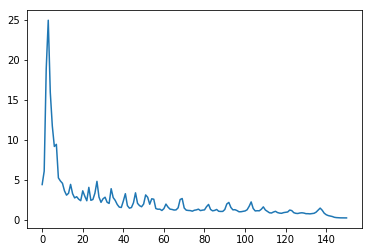

In [250]:
plt.plot( range(len(song1_fft[0])) , np.apply_along_axis(np.mean, 0, song1_fft) )

In [251]:
np.shape(song1_fft)

(4112, 151)

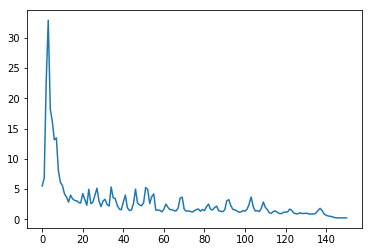

In [254]:
plt.plot(range(len(song1_fft[0])),np.apply_along_axis(np.std, 0, song1_fft))

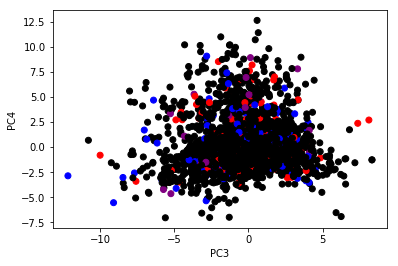

In [337]:
plt.scatter(PCs_3_4_X[:,2],PCs_3_4_X[:,3],
            color=[['black','red','blue','purple'][i] for i in PCs_3_4_Y.astype(int)])
plt.xlabel("PC3")
plt.ylabel("PC4")
plt.show()

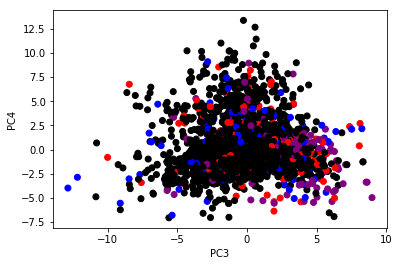

In [338]:
plt.scatter(PCs[:,2],PCs[:,3],
            color=[['black','red','blue','purple'][i] for i in Y.astype(int)])
plt.xlabel("PC3")
plt.ylabel("PC4")
plt.show()

IndexError: index 149 is out of bounds for axis 1 with size 149

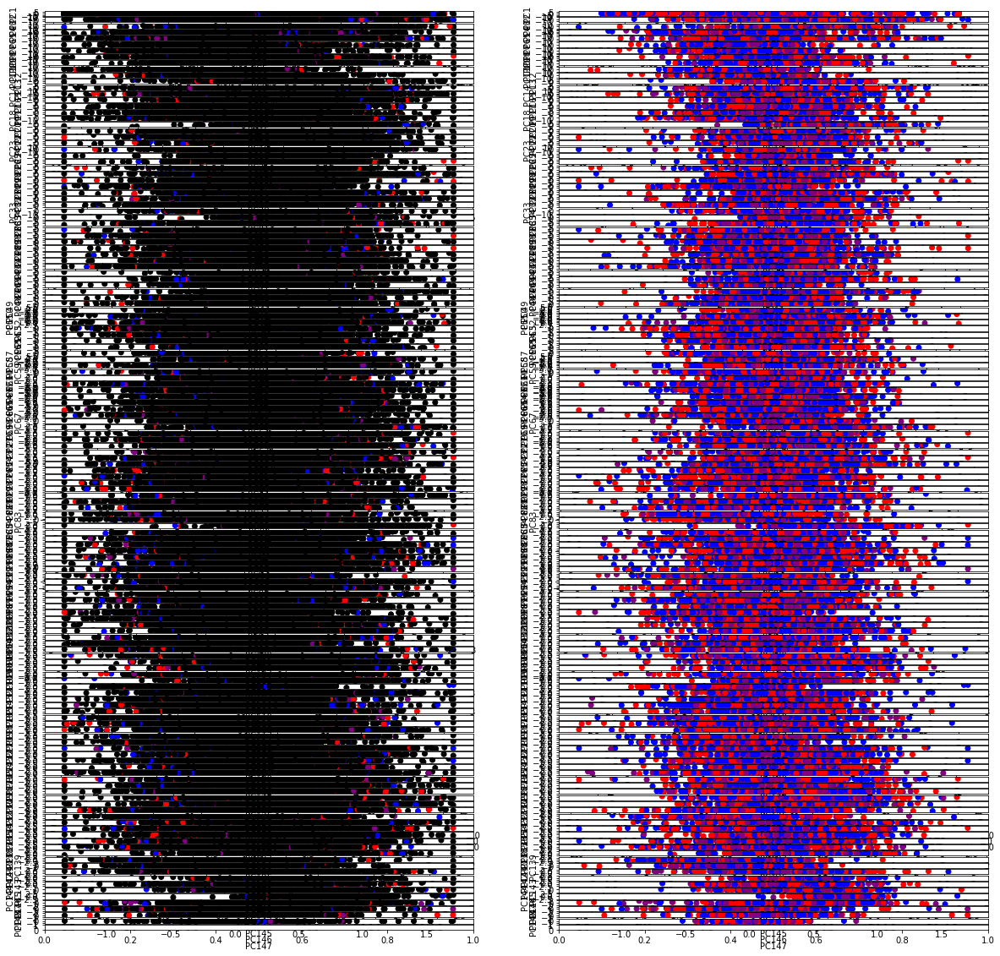

In [372]:
fig,axes = plt.subplots(149,2) 
fig.set_figwidth(20) 
fig.set_figheight(20)
for x in range(149):
    for y in range(2):
        start = x
        slice = (start, start+1)
        if y == 0:
            axes[x,y].scatter(PCs_2_X[:,slice[0]],PCs_2_X[:,slice[1]],
                    color=[['black','red','blue','purple'][i] for i in PCs_2_Y.astype(int)])
            axes[x,y].set_xlabel(str("PC"+str(slice[0])))
            axes[x,y].set_ylabel(str("PC"+str(slice[1])))
        else:
            axes[x,y].scatter(PCs_2_X[:,slice[0]],PCs_2_X[:,slice[1]],
                    color=[['none','red','blue','purple'][i] for i in PCs_2_Y.astype(int)])
            axes[x,y].set_xlabel(str("PC"+str(slice[0])))
            axes[x,y].set_ylabel(str("PC"+str(slice[1])))


            
plt.show()